# Dask arrays

Let's explore Dask arrays!

In [1]:
import numpy as np
import dask.array as da

Let's create a random dask array, do some operation and visualize it:

In [2]:
x = da.random.random((2000, 2000), chunks=(500, 500))
x

dask.array<random_sample, shape=(2000, 2000), dtype=float64, chunksize=(500, 500), chunktype=numpy.ndarray>

In [3]:
x = da.random.random((6000, 6000))
x

dask.array<random_sample, shape=(6000, 6000), dtype=float64, chunksize=(4096, 4096), chunktype=numpy.ndarray>

In [4]:
y = x.mean()

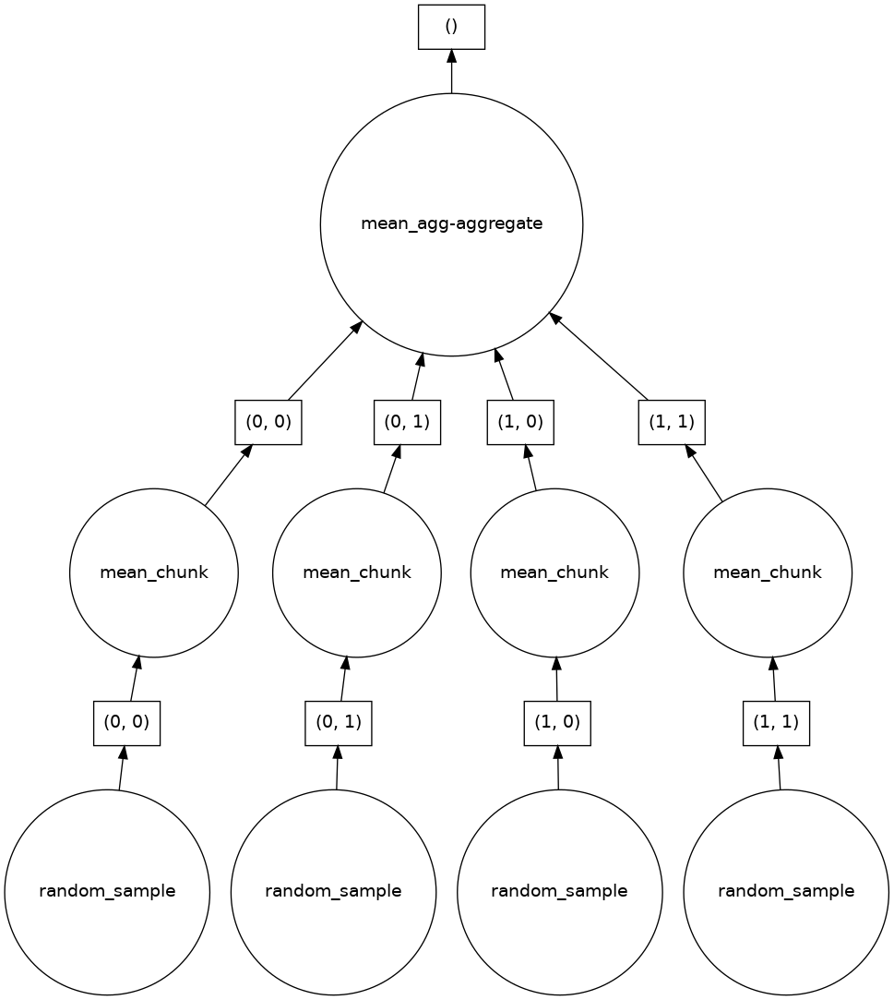

In [5]:
y.visualize()

Let's increase the size of the array and compute the operation.

In [6]:
%%time
N = 20000
x = da.random.random((N, N))
y = x.mean()
y.compute()

CPU times: user 6.81 s, sys: 1.47 s, total: 8.29 s
Wall time: 760 ms


0.49998008989089315

Let's compare the results with NumPy:

In [7]:
%%time
N = 20000
rng = np.random.default_rng()
x = rng.random((N, N))
x.mean()

CPU times: user 2.02 s, sys: 822 ms, total: 2.84 s
Wall time: 2.84 s


0.49998429354871976

<mark>**Question**</mark>: Try the two cells above with `N = 200`. Which one is faster, the numpy version or the dask one?

***

Let's consider now the operation `x @ x`. <mark>**Question**</mark>: Could you explain the results of the timings?

In [14]:
%%time
N = 20000
x = rng.random((N, N))
y = x @ x # matrix-matrix multiplication

CPU times: user 7min 49s, sys: 8.63 s, total: 7min 58s
Wall time: 42.2 s


In [15]:
N = 20000
x = da.random.random((N, N))
y = x @ x

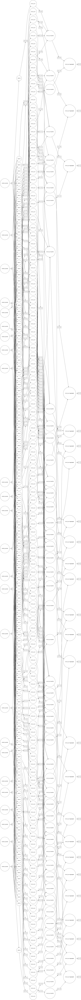

In [16]:
y.visualize(rankdir='LR')

In [17]:
%%time
y.compute().shape

CPU times: user 9min 34s, sys: 1min 10s, total: 10min 45s
Wall time: 54.3 s


(20000, 20000)